In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn import metrics

In [13]:
df=pd.read_excel('compactiv.xlsx')

In [3]:
df.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [16]:
df.tail()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,8.02,...,55.11,0.6,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,...,0.20,0.8,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,0.40,...,0.00,0.4,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,1.40,...,18.04,0.4,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83
8191,2,0,985,55,46,1.6,4.80,111111.0,22256.0,0.00,...,0.00,0.2,3.40,6.20,91.80,110.00,CPU_Bound,659,1756514,94


In [4]:
df.dtypes

lread         int64
lwrite        int64
scall         int64
sread         int64
swrite        int64
fork        float64
exec        float64
rchar       float64
wchar       float64
pgout       float64
ppgout      float64
pgfree      float64
pgscan      float64
atch        float64
pgin        float64
ppgin       float64
pflt        float64
vflt        float64
runqsz       object
freemem       int64
freeswap      int64
usr           int64
dtype: object

In [5]:
df.shape

(8192, 22)

In [6]:
df.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap', 'usr'],
      dtype='object')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.0,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.0,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.0,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.0,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.0,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.4,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.2,1.2,2.800,59.56
rchar,8088.0,1.973857e+05,239837.493526,278.0,34091.5,125473.5,267828.750,2526649.00
wchar,8177.0,9.590299e+04,140841.707911,1498.0,22916.0,46619.0,106101.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.0,0.0,2.400,81.44


In [9]:
df.runqsz.astype("object")

0           CPU_Bound
1       Not_CPU_Bound
2       Not_CPU_Bound
3       Not_CPU_Bound
4       Not_CPU_Bound
            ...      
8187        CPU_Bound
8188    Not_CPU_Bound
8189    Not_CPU_Bound
8190        CPU_Bound
8191        CPU_Bound
Name: runqsz, Length: 8192, dtype: object

In [18]:
df['runqsz'].unique()

array(['CPU_Bound', 'Not_CPU_Bound'], dtype=object)

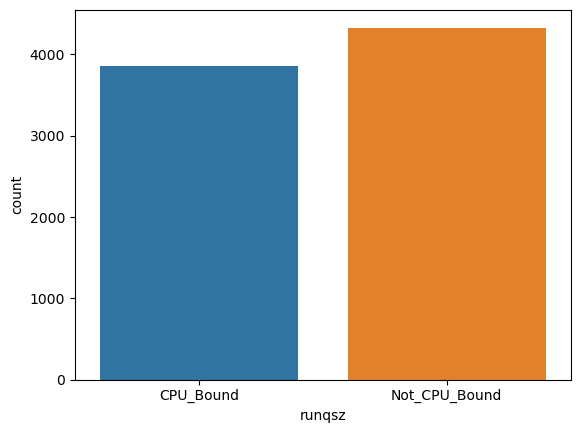

In [15]:
sns.countplot(data=df, x='runqsz')
plt.show()

In [17]:
df['runqsz'].value_counts()

Not_CPU_Bound    4331
CPU_Bound        3861
Name: runqsz, dtype: int64

In [11]:
df_dum=pd.get_dummies(df,columns=['runqsz'],drop_first=True)

In [12]:
df_dum.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_Not_CPU_Bound
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,4670,1730946,95,0
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,7278,1869002,97,1
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,702,1021237,87,1
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,7248,1863704,98,1
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,633,1760253,90,1


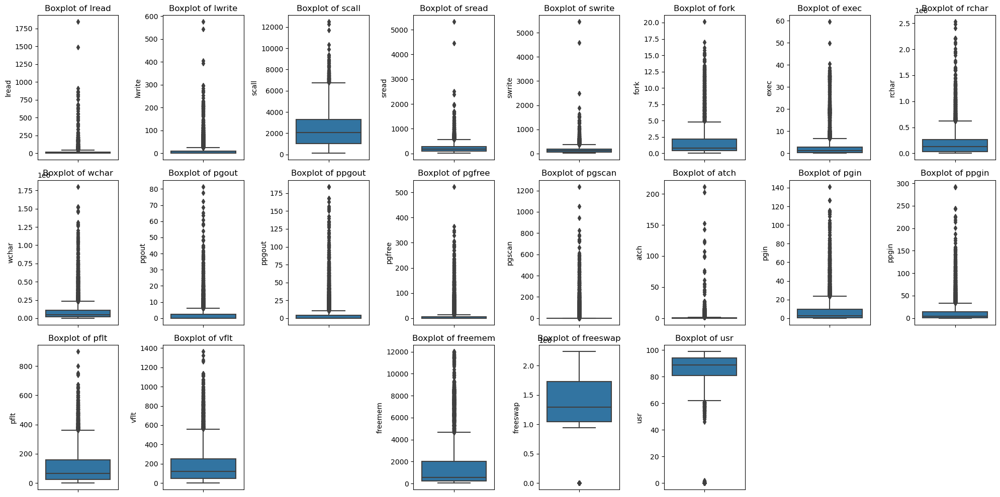

In [13]:
plt.figure(figsize=(20, 10))
f = df.columns

num_plots = len(f)  # Total number of plots
num_rows = (num_plots - 1) // 8 + 1  # Calculate the number of rows needed

for i in range(num_plots):
    if df[f[i]].dtype != 'object':  # Check if the variable is numeric
        plt.subplot(num_rows, 8, i + 1)
        sns.boxplot(y=df[f[i]], data=df)
        plt.title('Boxplot of {}'.format(f[i]))
        plt.tight_layout()

plt.show()

In [14]:
df_dum.isnull().sum()

lread                     0
lwrite                    0
scall                     0
sread                     0
swrite                    0
fork                      0
exec                      0
rchar                   104
wchar                    15
pgout                     0
ppgout                    0
pgfree                    0
pgscan                    0
atch                      0
pgin                      0
ppgin                     0
pflt                      0
vflt                      0
freemem                   0
freeswap                  0
usr                       0
runqsz_Not_CPU_Bound      0
dtype: int64

In [15]:
df_dum.mean()

lread                   1.955969e+01
lwrite                  1.310620e+01
scall                   2.306318e+03
sread                   2.104800e+02
swrite                  1.500582e+02
fork                    1.884554e+00
exec                    2.791998e+00
rchar                   1.973857e+05
wchar                   9.590299e+04
pgout                   2.285317e+00
ppgout                  5.977229e+00
pgfree                  1.191971e+01
pgscan                  2.152685e+01
atch                    1.127505e+00
pgin                    8.277960e+00
ppgin                   1.238859e+01
pflt                    1.097938e+02
vflt                    1.853158e+02
freemem                 1.763456e+03
freeswap                1.328126e+06
usr                     8.396887e+01
runqsz_Not_CPU_Bound    5.286865e-01
dtype: float64

In [16]:
mean_values = df_dum.mean()

df1 = df_dum.fillna(mean_values)

In [17]:
df1.isnull().sum()

lread                   0
lwrite                  0
scall                   0
sread                   0
swrite                  0
fork                    0
exec                    0
rchar                   0
wchar                   0
pgout                   0
ppgout                  0
pgfree                  0
pgscan                  0
atch                    0
pgin                    0
ppgin                   0
pflt                    0
vflt                    0
freemem                 0
freeswap                0
usr                     0
runqsz_Not_CPU_Bound    0
dtype: int64

In [18]:
df1.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_Not_CPU_Bound
0,1,0,2147,79,68,0.2,0.2,40671.000000,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,4670,1730946,95,0
1,0,0,170,18,21,0.2,0.2,448.000000,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,7278,1869002,97,1
2,15,3,2162,159,119,2.0,2.4,197385.728363,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,702,1021237,87,1
3,0,0,160,12,16,0.2,0.2,197385.728363,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,7248,1863704,98,1
4,5,1,330,39,38,0.4,0.4,197385.728363,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,633,1760253,90,1


In [19]:
df1.describe().T 

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.00,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.00,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.00,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.00,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.00,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.40,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.20,1.2,2.800,59.56
rchar,8192.0,1.973857e+05,238310.037735,278.0,34860.50,127825.0,265394.750,2526649.00
wchar,8192.0,9.590299e+04,140712.688639,1498.0,22977.75,46653.0,106037.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.00,0.0,2.400,81.44


In [20]:
dups=df1.duplicated()
print('Number of Duplicated rows = %d'%(dups.sum()))

Number of Duplicated rows = 0


In [21]:
df1[~df1.applymap(np.isreal).all(1)]

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_Not_CPU_Bound


<AxesSubplot:>

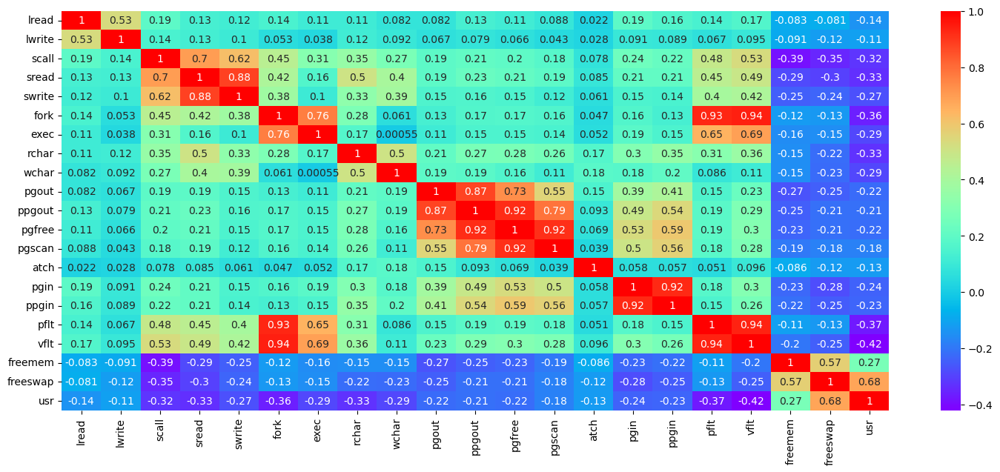

In [22]:
plt.figure(figsize=(18,7))
sns.heatmap(df.corr(), annot=True, cbar=True, cmap='rainbow')

In [23]:
zero_counts = (df == 0).sum()

print(zero_counts)

lread        675
lwrite      2684
scall          0
sread          0
swrite         0
fork          21
exec          21
rchar          0
wchar          0
pgout       4878
ppgout      4878
pgfree      4869
pgscan      6448
atch        4575
pgin        1220
ppgin       1220
pflt           3
vflt           0
runqsz         0
freemem        0
freeswap       0
usr          283
dtype: int64


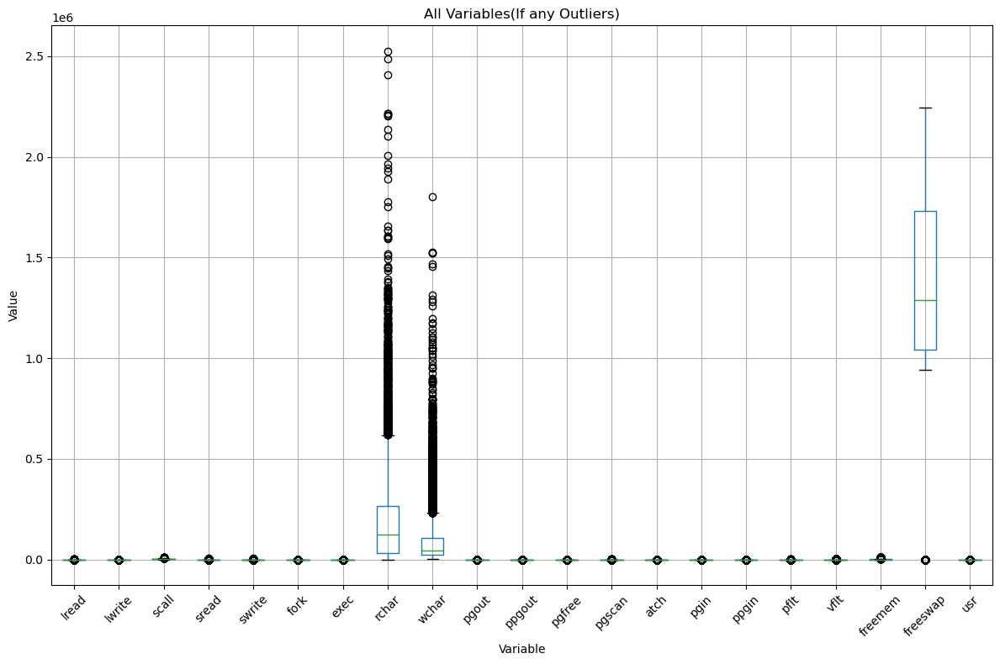

In [24]:
plt.figure(figsize=(12, 8))
df.boxplot()
plt.title('All Variables(If any Outliers)')
plt.xlabel('Variable')
plt.ylabel('Value')

plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

In [25]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5*IQR)
    upper_range= Q3+(1.5*IQR)
    return lower_range, upper_range

In [26]:
for column in df1.columns:
    lr,ur= remove_outlier(df1[column])
    df1[column]=np.where(df1[column]>ur,ur,df1[column])
    df1[column]=np.where(df1[column]<lr,lr,df1[column])

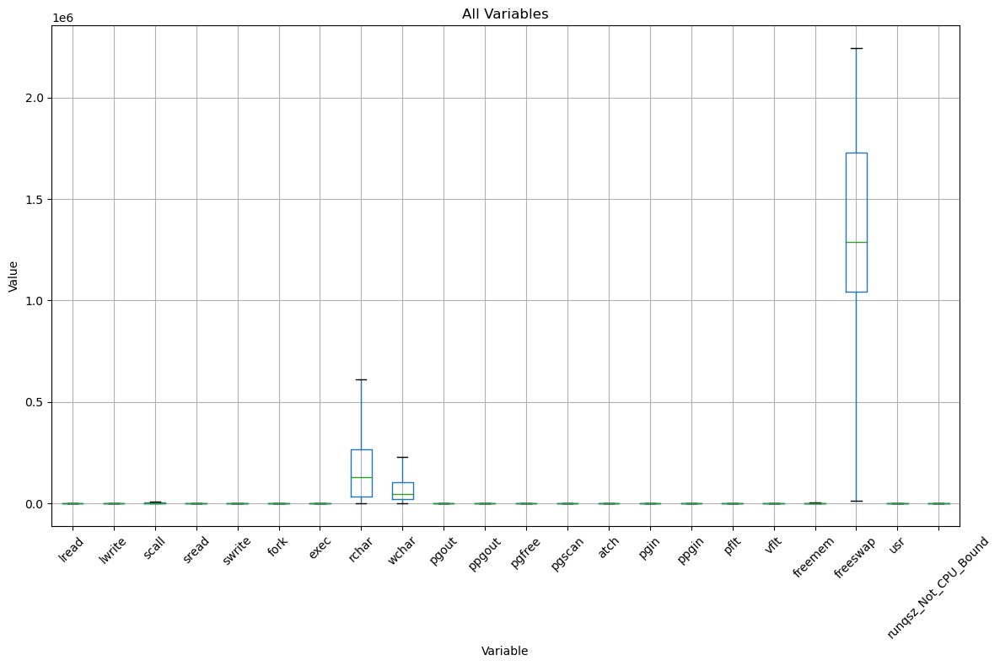

In [27]:
plt.figure(figsize=(12, 8))
df1.boxplot()
plt.title('All Variables')
plt.xlabel('Variable')
plt.ylabel('Value')

plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

In [28]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.342285e+01,15.159741,0.0,2.00,7.0,20.000,4.700000e+01
lwrite,8192.0,6.657471e+00,9.291945,0.0,0.00,1.0,10.000,2.500000e+01
scall,8192.0,2.294484e+03,1593.093446,109.0,1012.00,2051.5,3317.250,6.775125e+03
sread,8192.0,1.997764e+02,146.758932,6.0,86.00,166.0,279.000,5.685000e+02
swrite,8192.0,1.379700e+02,97.141835,7.0,63.00,117.0,185.000,3.680000e+02
fork,8192.0,1.557771e+00,1.591220,0.0,0.40,0.8,2.200,4.900000e+00
exec,8192.0,1.931495e+00,2.028253,0.0,0.20,1.2,2.800,6.700000e+00
rchar,8192.0,1.797970e+05,174495.517891,278.0,34860.50,127825.0,265394.750,6.111961e+05
wchar,8192.0,7.573578e+04,71257.347749,1498.0,22977.75,46653.0,106037.000,2.306259e+05
pgout,8192.0,1.420901e+00,2.200251,0.0,0.00,0.0,2.400,6.000000e+00


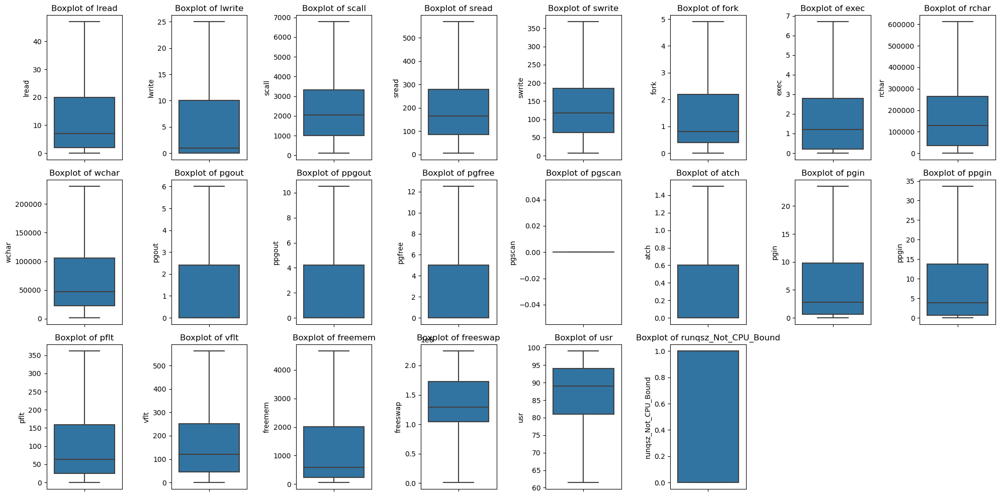

In [29]:
plt.figure(figsize=(20, 10))
f = df1.columns

num_plots = len(f)  # Total number of plots
num_rows = (num_plots - 1) // 8 + 1  # Calculate the number of rows needed

for i in range(num_plots):
    if df1[f[i]].dtype != 'object':  # Check if the variable is numeric
        plt.subplot(num_rows, 8, i + 1)
        sns.boxplot(y=df1[f[i]], data=df1)
        plt.title('Boxplot of {}'.format(f[i]))
        plt.tight_layout()

plt.show()

<Figure size 1200x1200 with 0 Axes>

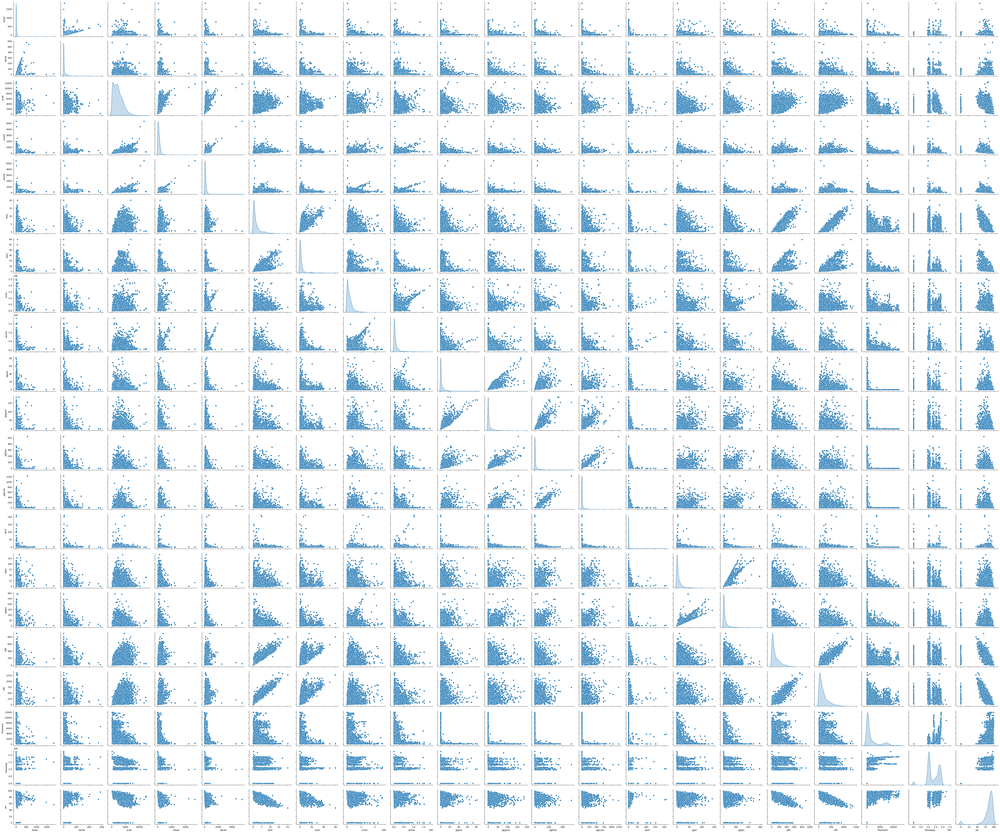

In [30]:
plt.figure(figsize=(12, 12))
sns.pairplot(df, diag_kind='kde', height=2.5, aspect=1.2)
plt.show()

In [31]:
df.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap', 'usr'],
      dtype='object')

In [32]:
X=df1.drop('usr',axis=1)
y=df1[['usr']]

In [33]:
X.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,runqsz_Not_CPU_Bound
0,1.0,0.0,2147.0,79.0,68.0,0.2,0.2,40671.000000,53995.0,0.0,...,0.0,0.0,0.0,1.6,2.6,16.00,26.40,4659.125,1730946.0,0.0
1,0.0,0.0,170.0,18.0,21.0,0.2,0.2,448.000000,8385.0,0.0,...,0.0,0.0,0.0,0.0,0.0,15.63,16.83,4659.125,1869002.0,1.0
2,15.0,3.0,2162.0,159.0,119.0,2.0,2.4,197385.728363,31950.0,0.0,...,0.0,0.0,1.2,6.0,9.4,150.20,220.20,702.000,1021237.0,1.0
3,0.0,0.0,160.0,12.0,16.0,0.2,0.2,197385.728363,8670.0,0.0,...,0.0,0.0,0.0,0.2,0.2,15.60,16.80,4659.125,1863704.0,1.0
4,5.0,1.0,330.0,39.0,38.0,0.4,0.4,197385.728363,12185.0,0.0,...,0.0,0.0,0.0,1.0,1.2,37.80,47.60,633.000,1760253.0,1.0


In [34]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test=train_test_split(X,y, test_size=0.30, random_state=2)

In [35]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

In [36]:
model = LinearRegression()

model.fit(X_train, y_train)

LinearRegression()

In [37]:
y_train_pred = model.predict(X_train)

In [38]:
mse_train = mean_squared_error(y_train, y_train_pred)
r2_train = r2_score(y_train, y_train_pred)

In [39]:
print("Training Set Evaluation:")
print("Mean Squared Error (MSE):", mse_train)
print("R-squared (R2) Score:", r2_train)
rmse = np.sqrt(mse_train)
print("RMSE:", rmse)

Training Set Evaluation:
Mean Squared Error (MSE): 20.188694872384822
R-squared (R2) Score: 0.7855998601202907
RMSE: 4.493183155891247


In [40]:
y_test_pred = model.predict(X_test)

In [41]:
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)

In [42]:
print("\nTest Set Evaluation:")
print("Mean Squared Error (MSE):", mse_test)
print("R-squared (R2) Score:", r2_test)
rmse = np.sqrt(mse_test)
print("RMSE:", rmse)


Test Set Evaluation:
Mean Squared Error (MSE): 20.048051022018672
R-squared (R2) Score: 0.7933360631038957
RMSE: 4.477504999664285


In [43]:
intercept = model.intercept_

coefficients = model.coef_


print("Intercept:", intercept)
print("Coefficients:", coefficients)


Intercept: [83.05839481]
Coefficients: [[-4.88128702e-02  3.79393055e-02 -6.55344637e-04  1.16554146e-03
  -6.25997074e-03 -6.11743317e-02 -3.00464139e-01 -4.94214110e-06
  -5.38414435e-06 -4.64270118e-01  4.41758974e-02  2.35973908e-02
  -3.33066907e-16  7.73146181e-01  2.67911125e-02 -7.46791796e-02
  -3.27448535e-02 -4.90936288e-03 -4.52008454e-04  9.29393792e-06
   1.88652746e+00]]


In [22]:
intercept = 83.05839481
coefficients = [-4.88128702e-02, 3.79393055e-02, -6.55344637e-04, 1.16554146e-03,
               -6.25997074e-03, -6.11743317e-02, -3.00464139e-01, -4.94214110e-06,
               -5.38414435e-06, -4.64270118e-01, 4.41758974e-02, 2.35973908e-02,
               -3.33066907e-16, 7.73146181e-01, 2.67911125e-02, -7.46791796e-02,
               -3.27448535e-02, -4.90936288e-03, -4.52008454e-04, 9.29393792e-06,
               1.88652746e+00]

variables = ['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
             'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
             'pflt', 'vflt', 'freemem', 'freeswap', 'runqsz_Not_CPU_Bound']

# Create the linear equation string
linear_equation = f'y = {intercept:.5f}'

for variable, coefficient in zip(variables, coefficients):
    if coefficient >= 0:
        linear_equation += f' + {coefficient:.5f} * {variable}'
    else:
        linear_equation += f' - {-coefficient:.5f} * {variable}'

print(linear_equation)


y = 83.05839 - 0.04881 * lread + 0.03794 * lwrite - 0.00066 * scall + 0.00117 * sread - 0.00626 * swrite - 0.06117 * fork - 0.30046 * exec - 0.00000 * rchar - 0.00001 * wchar - 0.46427 * pgout + 0.04418 * ppgout + 0.02360 * pgfree - 0.00000 * pgscan + 0.77315 * atch + 0.02679 * pgin - 0.07468 * ppgin - 0.03274 * pflt - 0.00491 * vflt - 0.00045 * freemem + 0.00001 * freeswap + 1.88653 * runqsz_Not_CPU_Bound


In [44]:
import statsmodels.api as sm

In [45]:
X_train=sm.add_constant(X_train)
X_test=sm.add_constant(X_test)

In [48]:
model1=sm.OLS(y_train,X_train).fit()
print(model1.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.786
Model:                            OLS   Adj. R-squared:                  0.785
Method:                 Least Squares   F-statistic:                     1047.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        16:21:52   Log-Likelihood:                -16752.
No. Observations:                5734   AIC:                         3.355e+04
Df Residuals:                    5713   BIC:                         3.369e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   83.0584 

In [47]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train.values,i)for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values:  \n\n{}\n".format(vif_series1))

VIF values:  

const                   27.597251
lread                    5.163698
lwrite                   4.260489
scall                    2.963615
sread                    6.735500
swrite                   5.799549
fork                    12.595784
exec                     3.104367
rchar                    2.117378
wchar                    1.612945
pgout                   11.490281
ppgout                  30.813527
pgfree                  17.461990
pgscan                        NaN
atch                     1.836885
pgin                    13.531714
ppgin                   13.828682
pflt                    11.224761
vflt                    14.386823
freemem                  1.956149
freeswap                 1.788994
runqsz_Not_CPU_Bound     1.146916
dtype: float64



C:\Users\souradip\anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: invalid value encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


In [49]:
from sklearn.metrics import mean_squared_error


y_train_pred = model1.predict(X_train)
y_test_pred = model1.predict(X_test)


mse_train = mean_squared_error(y_train, y_train_pred)
print("MSE for train data:", mse_train)
mse_test = mean_squared_error(y_test, y_test_pred)
print("MSE for test data:", mse_test)

MSE for train data: 20.188694872384815
MSE for test data: 20.04805102202073


In [50]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np


y_train_pred = model1.predict(X_train)
y_test_pred = model1.predict(X_test)


mse_train = mean_squared_error(y_train, y_train_pred)
rmse_train = np.sqrt(mse_train)
print("RMSE for train data:", rmse_train)


mse_test = mean_squared_error(y_test, y_test_pred)
rmse_test = np.sqrt(mse_test)
print("RMSE for test data:", rmse_test)


r2_train = r2_score(y_train, y_train_pred)
print("R^2 for train data:", r2_train)
r2_test = r2_score(y_test, y_test_pred)
print("R^2 for test data:", r2_test)

RMSE for train data: 4.493183155891246
RMSE for test data: 4.477504999664515
R^2 for train data: 0.7855998601202908
R^2 for test data: 0.7933360631038745


In [51]:
X_train2 = X_train.drop(["pgscan"],axis=1)
olsmod_1 = sm.OLS(y_train,X_train2)
olsres_1 = olsmod_1.fit()
print(
"R-squared:",
np.round(olsres_1.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_1.rsquared_adj,3),
)

R-squared: 0.786 
Adjusted R-squared: 0.785


In [38]:
X_train3 = X_train.drop(["ppgout"],axis=1)
olsmod_2 = sm.OLS(y_train,X_train3)
olsres_2 = olsmod_2.fit()
print(
"R-squared:",
np.round(olsres_2.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_2.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [39]:
X_train4 = X_train.drop(["pgfree"],axis=1)
olsmod_3 = sm.OLS(y_train,X_train4)
olsres_3 = olsmod_3.fit()
print(
"R-squared:",
np.round(olsres_3.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_3.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [40]:
X_train5 = X_train.drop(["vflt"],axis=1)
olsmod_4 = sm.OLS(y_train,X_train5)
olsres_4 = olsmod_4.fit()
print(
"R-squared:",
np.round(olsres_4.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_4.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [41]:
X_train6 = X_train.drop(["ppgin"],axis=1)
olsmod_5 = sm.OLS(y_train,X_train6)
olsres_5 = olsmod_5.fit()
print(
"R-squared:",
np.round(olsres_5.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_5.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [42]:
X_train7 = X_train.drop(["pgin"],axis=1)
olsmod_6 = sm.OLS(y_train,X_train7)
olsres_6 = olsmod_6.fit()
print(
"R-squared:",
np.round(olsres_6.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_6.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [43]:
X_train8 = X_train.drop(["fork"],axis=1)
olsmod_7 = sm.OLS(y_train,X_train8)
olsres_7 = olsmod_7.fit()
print(
"R-squared:",
np.round(olsres_7.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_7.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [44]:
X_train9 = X_train.drop(["pflt"],axis=1)
olsmod_8 = sm.OLS(y_train,X_train9)
olsres_8 = olsmod_8.fit()
print(
"R-squared:",
np.round(olsres_8.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_8.rsquared_adj,3),
)

R-squared: 0.786 
Adjusted R-squared: 0.785


In [45]:
X_train10 = X_train.drop(["pgout"],axis=1)
olsmod_9 = sm.OLS(y_train,X_train10)
olsres_9 = olsmod_9.fit()
print(
"R-squared:",
np.round(olsres_9.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_9.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [46]:
X_train11 = X_train.drop(["sread"],axis=1)
olsmod_10 = sm.OLS(y_train,X_train11)
olsres_10 = olsmod_10.fit()
print(
"R-squared:",
np.round(olsres_10.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_10.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [47]:
X_train12 = X_train.drop(["swrite"],axis=1)
olsmod_11 = sm.OLS(y_train,X_train12)
olsres_11 = olsmod_11.fit()
print(
"R-squared:",
np.round(olsres_11.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_11.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [48]:
X_train13 = X_train.drop(["lread"],axis=1)
olsmod_12 = sm.OLS(y_train,X_train13)
olsres_12 = olsmod_12.fit()
print(
"R-squared:",
np.round(olsres_12.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_12.rsquared_adj,3),
)

R-squared: 0.794 
Adjusted R-squared: 0.794


In [49]:
X_train14 = X_train.drop(["lwrite"],axis=1)
olsmod_13 = sm.OLS(y_train,X_train14)
olsres_13 = olsmod_13.fit()
print(
"R-squared:",
np.round(olsres_13.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_13.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [50]:
X_train15 = X_train.drop(["exec"],axis=1)
olsmod_14 = sm.OLS(y_train,X_train15)
olsres_14 = olsmod_14.fit()
print(
"R-squared:",
np.round(olsres_14.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_14.rsquared_adj,3),
)

R-squared: 0.795 
Adjusted R-squared: 0.794


In [51]:
X_train16 = X_train.drop(["scall"],axis=1)
olsmod_15 = sm.OLS(y_train,X_train16)
olsres_15 = olsmod_15.fit()
print(
"R-squared:",
np.round(olsres_15.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_15.rsquared_adj,3),
)

R-squared: 0.792 
Adjusted R-squared: 0.791


In [52]:
X_train=X_train.drop(["pgscan"],axis=1)

In [53]:
olsmodel_16 = sm.OLS(y_train,X_train)
olsres_16 = olsmodel_16.fit()
print(olsres_16.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1116.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        02:14:21   Log-Likelihood:                -16656.
No. Observations:                5734   AIC:                         3.335e+04
Df Residuals:                    5713   BIC:                         3.349e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.1314 

In [54]:
vif_series2 = pd.Series(
    [variance_inflation_factor(X_train.values,i)for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values:  \n\n{}\n".format(vif_series2))

VIF values:  

const                   29.239441
lread                    5.350218
lwrite                   4.328116
scall                    2.960756
sread                    6.415575
swrite                   5.594100
fork                    13.035282
exec                     3.241124
rchar                    2.129470
wchar                    1.583532
pgout                   11.359771
ppgout                  29.404123
pgfree                  16.497072
atch                     1.876238
pgin                    13.809962
ppgin                   13.951564
pflt                    12.001532
vflt                    15.968862
freemem                  1.961657
freeswap                 1.841358
runqsz_Not_CPU_Bound     1.157096
dtype: float64



In [55]:
X_train17 = X_train.drop(["ppgout"],axis=1)
olsmod_17 = sm.OLS(y_train,X_train17)
olsres_17 = olsmod_17.fit()
print(
"R-squared:",
np.round(olsres_17.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_17.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [56]:
X_train18 = X_train.drop(["pgfree"],axis=1)
olsmod_18 = sm.OLS(y_train,X_train18)
olsres_18 = olsmod_18.fit()
print(
"R-squared:",
np.round(olsres_18.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_18.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [57]:
X_train19 = X_train.drop(["vflt"],axis=1)
olsmod_19 = sm.OLS(y_train,X_train19)
olsres_19 = olsmod_19.fit()
print(
"R-squared:",
np.round(olsres_19.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_19.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [58]:
X_train20 = X_train.drop(["vflt"],axis=1)
olsmod_20 = sm.OLS(y_train,X_train20)
olsres_20 = olsmod_20.fit()
print(
"R-squared:",
np.round(olsres_20.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_20.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [59]:
X_train21 = X_train.drop(["ppgin"],axis=1)
olsmod_21 = sm.OLS(y_train,X_train21)
olsres_21 = olsmod_21.fit()
print(
"R-squared:",
np.round(olsres_21.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_21.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [60]:
X_train22 = X_train.drop(["pgin"],axis=1)
olsmod_22 = sm.OLS(y_train,X_train22)
olsres_22 = olsmod_22.fit()
print(
"R-squared:",
np.round(olsres_22.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_22.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [61]:
X_train23 = X_train.drop(["fork"],axis=1)
olsmod_23 = sm.OLS(y_train,X_train23)
olsres_23 = olsmod_23.fit()
print(
"R-squared:",
np.round(olsres_23.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_23.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [62]:
X_train24 = X_train.drop(["pgout"],axis=1)
olsmod_24 = sm.OLS(y_train,X_train24)
olsres_24 = olsmod_24.fit()
print(
"R-squared:",
np.round(olsres_24.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_24.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [63]:
X_train25 = X_train.drop(["sread"],axis=1)
olsmod_25 = sm.OLS(y_train,X_train25)
olsres_25 = olsmod_25.fit()
print(
"R-squared:",
np.round(olsres_25.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_25.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [64]:
X_train26 = X_train.drop(["swrite"],axis=1)
olsmod_26 = sm.OLS(y_train,X_train26)
olsres_26 = olsmod_26.fit()
print(
"R-squared:",
np.round(olsres_26.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_26.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [65]:
X_train27 = X_train.drop(["lread"],axis=1)
olsmod_27 = sm.OLS(y_train,X_train27)
olsres_27 = olsmod_27.fit()
print(
"R-squared:",
np.round(olsres_27.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_27.rsquared_adj,3),
)

R-squared: 0.794 
Adjusted R-squared: 0.794


In [66]:
X_train28 = X_train.drop(["lwrite"],axis=1)
olsmod_28 = sm.OLS(y_train,X_train28)
olsres_28 = olsmod_28.fit()
print(
"R-squared:",
np.round(olsres_28.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_28.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [67]:
X_train29 = X_train.drop(["exec"],axis=1)
olsmod_29 = sm.OLS(y_train,X_train29)
olsres_29 = olsmod_29.fit()
print(
"R-squared:",
np.round(olsres_29.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_29.rsquared_adj,3),
)

R-squared: 0.795 
Adjusted R-squared: 0.794


In [68]:
X_train = X_train.drop(["ppgout"],axis=1)

In [69]:
olsmod_30 = sm.OLS(y_train,X_train)
olsres_30 = olsmod_30.fit()
print(olsres_30.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1174.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        02:14:35   Log-Likelihood:                -16657.
No. Observations:                5734   AIC:                         3.335e+04
Df Residuals:                    5714   BIC:                         3.349e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.1580 

In [70]:
vif_series3 = pd.Series(
    [variance_inflation_factor(X_train.values,i)for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values:  \n\n{}\n".format(vif_series3))

VIF values:  

const                   29.032870
lread                    5.350047
lwrite                   4.328043
scall                    2.960539
sread                    6.415504
swrite                   5.594015
fork                    13.027207
exec                     3.238925
rchar                    2.129451
wchar                    1.579945
pgout                    6.454277
pgfree                   6.172906
atch                     1.875900
pgin                    13.784432
ppgin                   13.898089
pflt                    12.001532
vflt                    15.964611
freemem                  1.959604
freeswap                 1.838299
runqsz_Not_CPU_Bound     1.156712
dtype: float64



In [71]:
X_train31 = X_train.drop(["vflt"],axis=1)
olsmod_31 = sm.OLS(y_train,X_train31)
olsres_31 = olsmod_31.fit()
print(
"R-squared:",
np.round(olsres_31.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_31.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [72]:
X_train32 = X_train.drop(["ppgin"],axis=1)
olsmod_32 = sm.OLS(y_train,X_train32)
olsres_32 = olsmod_32.fit()
print(
"R-squared:",
np.round(olsres_32.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_32.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [73]:
X_train33 = X_train.drop(["pgin"],axis=1)
olsmod_33 = sm.OLS(y_train,X_train33)
olsres_33 = olsmod_33.fit()
print(
"R-squared:",
np.round(olsres_33.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_33.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [74]:
X_train34 = X_train.drop(["fork"],axis=1)
olsmod_34 = sm.OLS(y_train,X_train34)
olsres_34 = olsmod_34.fit()
print(
"R-squared:",
np.round(olsres_34.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_34.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [75]:
X_train35 = X_train.drop(["pflt"],axis=1)
olsmod_35 = sm.OLS(y_train,X_train35)
olsres_35 = olsmod_35.fit()
print(
"R-squared:",
np.round(olsres_35.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_35.rsquared_adj,3),
)

R-squared: 0.786 
Adjusted R-squared: 0.785


In [76]:
X_train36 = X_train.drop(["pgfree"],axis=1)
olsmod_36 = sm.OLS(y_train,X_train36)
olsres_36 = olsmod_36.fit()
print(
"R-squared:",
np.round(olsres_36.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_36.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [77]:
X_train37 = X_train.drop(["pgout"],axis=1)
olsmod_37 = sm.OLS(y_train,X_train37)
olsres_37 = olsmod_37.fit()
print(
"R-squared:",
np.round(olsres_37.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_37.rsquared_adj,3),
)

R-squared: 0.795 
Adjusted R-squared: 0.794


In [78]:
X_train38 = X_train.drop(["sread"],axis=1)
olsmod_38 = sm.OLS(y_train,X_train38)
olsres_38 = olsmod_38.fit()
print(
"R-squared:",
np.round(olsres_38.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_38.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [79]:
X_train39 = X_train.drop(["swrite"],axis=1)
olsmod_39 = sm.OLS(y_train,X_train39)
olsres_39 = olsmod_39.fit()
print(
"R-squared:",
np.round(olsres_39.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_39.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [80]:
X_train40 = X_train.drop(["lread"],axis=1)
olsmod_40 = sm.OLS(y_train,X_train40)
olsres_40 = olsmod_40.fit()
print(
"R-squared:",
np.round(olsres_40.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_40.rsquared_adj,3),
)

R-squared: 0.794 
Adjusted R-squared: 0.794


In [81]:
X_train41 = X_train.drop(["lwrite"],axis=1)
olsmod_41 = sm.OLS(y_train,X_train41)
olsres_41 = olsmod_41.fit()
print(
"R-squared:",
np.round(olsres_41.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_41.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [82]:
X_train42 = X_train.drop(["exec"],axis=1)
olsmod_42 = sm.OLS(y_train,X_train42)
olsres_42 = olsmod_42.fit()
print(
"R-squared:",
np.round(olsres_42.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_42.rsquared_adj,3),
)

R-squared: 0.795 
Adjusted R-squared: 0.794


In [83]:
X_train43 = X_train.drop(["scall"],axis=1)
olsmod_43 = sm.OLS(y_train,X_train43)
olsres_43 = olsmod_43.fit()
print(
"R-squared:",
np.round(olsres_43.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_43.rsquared_adj,3),
)

R-squared: 0.792 
Adjusted R-squared: 0.791


In [84]:
X_train = X_train.drop(["vflt"],axis=1)

In [85]:
olsmod_44 = sm.OLS(y_train,X_train)
olsres_44 = olsmod_44.fit()
print(olsres_44.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1236.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        02:14:57   Log-Likelihood:                -16664.
No. Observations:                5734   AIC:                         3.337e+04
Df Residuals:                    5715   BIC:                         3.349e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0194 

In [86]:
vif_series4 = pd.Series(
    [variance_inflation_factor(X_train.values,i)for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values:  \n\n{}\n".format(vif_series4))

VIF values:  

const                   28.653594
lread                    5.335051
lwrite                   4.326838
scall                    2.953114
sread                    6.369489
swrite                   5.592704
fork                    10.089022
exec                     3.235111
rchar                    2.119944
wchar                    1.558137
pgout                    6.451027
pgfree                   6.149320
atch                     1.864582
pgin                    13.602664
ppgin                   13.898088
pflt                     9.132270
freemem                  1.958294
freeswap                 1.787867
runqsz_Not_CPU_Bound     1.156656
dtype: float64



In [87]:
X_train45 = X_train.drop(["ppgin"],axis=1)
olsmod_45 = sm.OLS(y_train,X_train45)
olsres_45 = olsmod_45.fit()
print(
"R-squared:",
np.round(olsres_45.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_45.rsquared_adj,3),
)

R-squared: 0.795 
Adjusted R-squared: 0.795


In [88]:
X_train46 = X_train.drop(["pgin"],axis=1)
olsmod_46 = sm.OLS(y_train,X_train46)
olsres_46 = olsmod_46.fit()
print(
"R-squared:",
np.round(olsres_46.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_46.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [89]:
X_train47 = X_train.drop(["fork"],axis=1)
olsmod_47 = sm.OLS(y_train,X_train47)
olsres_47 = olsmod_47.fit()
print(
"R-squared:",
np.round(olsres_47.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_47.rsquared_adj,3),
)

R-squared: 0.795 
Adjusted R-squared: 0.795


In [90]:
X_train48 = X_train.drop(["fork"],axis=1)
olsmod_48 = sm.OLS(y_train,X_train48)
olsres_48 = olsmod_48.fit()
print(
"R-squared:",
np.round(olsres_48.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_48.rsquared_adj,3),
)

R-squared: 0.795 
Adjusted R-squared: 0.795


In [91]:
X_train49 = X_train.drop(["pflt"],axis=1)
olsmod_49 = sm.OLS(y_train,X_train49)
olsres_49 = olsmod_49.fit()
print(
"R-squared:",
np.round(olsres_49.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_49.rsquared_adj,3),
)

R-squared: 0.779 
Adjusted R-squared: 0.778


In [92]:
X_train50 = X_train.drop(["pgfree"],axis=1)
olsmod_50 = sm.OLS(y_train,X_train50)
olsres_50 = olsmod_50.fit()
print(
"R-squared:",
np.round(olsres_50.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_50.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [93]:
X_train51 = X_train.drop(["pgout"],axis=1)
olsmod_51 = sm.OLS(y_train,X_train51)
olsres_51 = olsmod_51.fit()
print(
"R-squared:",
np.round(olsres_51.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_51.rsquared_adj,3),
)

R-squared: 0.794 
Adjusted R-squared: 0.794


In [94]:
X_train52 = X_train.drop(["sread"],axis=1)
olsmod_52 = sm.OLS(y_train,X_train52)
olsres_52 = olsmod_52.fit()
print(
"R-squared:",
np.round(olsres_52.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_52.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [95]:
X_train53 = X_train.drop(["swrite"],axis=1)
olsmod_53 = sm.OLS(y_train,X_train53)
olsres_53 = olsmod_53.fit()
print(
"R-squared:",
np.round(olsres_53.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_53.rsquared_adj,3),
)

R-squared: 0.795 
Adjusted R-squared: 0.794


In [96]:
X_train54 = X_train.drop(["lread"],axis=1)
olsmod_54 = sm.OLS(y_train,X_train54)
olsres_54 = olsmod_54.fit()
print(
"R-squared:",
np.round(olsres_54.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_54.rsquared_adj,3),
)

R-squared: 0.794 
Adjusted R-squared: 0.793


In [97]:
X_train55 = X_train.drop(["lwrite"],axis=1)
olsmod_55 = sm.OLS(y_train,X_train55)
olsres_55 = olsmod_55.fit()
print(
"R-squared:",
np.round(olsres_55.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_55.rsquared_adj,3),
)

R-squared: 0.795 
Adjusted R-squared: 0.794


In [98]:
X_train56 = X_train.drop(["exec"],axis=1)
olsmod_56 = sm.OLS(y_train,X_train56)
olsres_56 = olsmod_56.fit()
print(
"R-squared:",
np.round(olsres_56.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_56.rsquared_adj,3),
)

R-squared: 0.794 
Adjusted R-squared: 0.794


In [99]:
X_train57 = X_train.drop(["scall"],axis=1)
olsmod_57 = sm.OLS(y_train,X_train57)
olsres_57 = olsmod_57.fit()
print(
"R-squared:",
np.round(olsres_57.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_57.rsquared_adj,3),
)

R-squared: 0.791 
Adjusted R-squared: 0.791


In [100]:
X_train = X_train.drop(["pgin"],axis=1)

In [101]:
olsmod_58 = sm.OLS(y_train,X_train)
olsres_58 = olsmod_58.fit()
print(olsres_58.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1309.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        02:15:16   Log-Likelihood:                -16664.
No. Observations:                5734   AIC:                         3.336e+04
Df Residuals:                    5716   BIC:                         3.348e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0280 

In [102]:
vif_series5 = pd.Series(
    [variance_inflation_factor(X_train.values,i)for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values:  \n\n{}\n".format(vif_series5))

VIF values:  

const                   28.410200
lread                    5.333501
lwrite                   4.326825
scall                    2.950524
sread                    6.369365
swrite                   5.592405
fork                    10.083691
exec                     3.231733
rchar                    2.110474
wchar                    1.557949
pgout                    6.443246
pgfree                   6.137213
atch                     1.864224
ppgin                    1.561741
pflt                     9.131499
freemem                  1.958283
freeswap                 1.774751
runqsz_Not_CPU_Bound     1.156581
dtype: float64



In [103]:
X_train59 = X_train.drop(["fork"],axis=1)
olsmod_59 = sm.OLS(y_train,X_train59)
olsres_59 = olsmod_59.fit()
print(
"R-squared:",
np.round(olsres_59.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_59.rsquared_adj,3),
)

R-squared: 0.795 
Adjusted R-squared: 0.795


In [104]:
X_train60 = X_train.drop(["pflt"],axis=1)
olsmod_60 = sm.OLS(y_train,X_train60)
olsres_60 = olsmod_60.fit()
print(
"R-squared:",
np.round(olsres_60.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_60.rsquared_adj,3),
)

R-squared: 0.779 
Adjusted R-squared: 0.778


In [105]:
X_train61 = X_train.drop(["pgfree"],axis=1)
olsmod_61 = sm.OLS(y_train,X_train61)
olsres_61 = olsmod_61.fit()
print(
"R-squared:",
np.round(olsres_61.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_61.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [106]:
X_train62 = X_train.drop(["pgout"],axis=1)
olsmod_62 = sm.OLS(y_train,X_train62)
olsres_62 = olsmod_62.fit()
print(
"R-squared:",
np.round(olsres_62.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_62.rsquared_adj,3),
)

R-squared: 0.794 
Adjusted R-squared: 0.794


In [107]:
X_train63 = X_train.drop(["sread"],axis=1)
olsmod_63 = sm.OLS(y_train,X_train63)
olsres_63 = olsmod_63.fit()
print(
"R-squared:",
np.round(olsres_63.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_63.rsquared_adj,3),
)

R-squared: 0.796 
Adjusted R-squared: 0.795


In [108]:
X_train64 = X_train.drop(["swrite"],axis=1)
olsmod_64 = sm.OLS(y_train,X_train64)
olsres_64 = olsmod_64.fit()
print(
"R-squared:",
np.round(olsres_64.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_64.rsquared_adj,3),
)

R-squared: 0.795 
Adjusted R-squared: 0.795


In [109]:
X_train65 = X_train.drop(["lread"],axis=1)
olsmod_65 = sm.OLS(y_train,X_train65)
olsres_65 = olsmod_65.fit()
print(
"R-squared:",
np.round(olsres_65.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_65.rsquared_adj,3),
)

R-squared: 0.794 
Adjusted R-squared: 0.793


In [110]:
X_train66 = X_train.drop(["lwrite"],axis=1)
olsmod_66 = sm.OLS(y_train,X_train66)
olsres_66 = olsmod_66.fit()
print(
"R-squared:",
np.round(olsres_66.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_66.rsquared_adj,3),
)

R-squared: 0.795 
Adjusted R-squared: 0.795


In [111]:
X_train67 = X_train.drop(["exec"],axis=1)
olsmod_67 = sm.OLS(y_train,X_train67)
olsres_67 = olsmod_67.fit()
print(
"R-squared:",
np.round(olsres_67.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_67.rsquared_adj,3),
)

R-squared: 0.794 
Adjusted R-squared: 0.794


In [112]:
X_train68 = X_train.drop(["scall"],axis=1)
olsmod_68 = sm.OLS(y_train,X_train68)
olsres_68 = olsmod_68.fit()
print(
"R-squared:",
np.round(olsres_68.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_68.rsquared_adj,3),
)

R-squared: 0.791 
Adjusted R-squared: 0.791


In [113]:
X_train = X_train.drop(["fork"],axis=1)

In [114]:
olsmod_69 = sm.OLS(y_train,X_train)
olsres_69 = olsmod_69.fit()
print(olsres_69.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1390.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        02:15:30   Log-Likelihood:                -16666.
No. Observations:                5734   AIC:                         3.337e+04
Df Residuals:                    5717   BIC:                         3.348e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0688 

In [115]:
vif_series6 = pd.Series(
    [variance_inflation_factor(X_train.values,i)for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values:  \n\n{}\n".format(vif_series6))

VIF values:  

const                   28.257910
lread                    5.312866
lwrite                   4.307391
scall                    2.913551
sread                    6.368258
swrite                   5.386952
exec                     2.852332
rchar                    2.109163
wchar                    1.549876
pgout                    6.443129
pgfree                   6.136279
atch                     1.863208
ppgin                    1.557901
pflt                     3.463095
freemem                  1.957763
freeswap                 1.772265
runqsz_Not_CPU_Bound     1.156015
dtype: float64



In [116]:
X_train70 = X_train.drop(["pgfree"],axis=1)
olsmod_70 = sm.OLS(y_train,X_train70)
olsres_70 = olsmod_70.fit()
print(
"R-squared:",
np.round(olsres_70.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_70.rsquared_adj,3),
)

R-squared: 0.795 
Adjusted R-squared: 0.795


In [117]:
X_train71 = X_train.drop(["pgout"],axis=1)
olsmod_71 = sm.OLS(y_train,X_train71)
olsres_71 = olsmod_71.fit()
print(
"R-squared:",
np.round(olsres_71.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_71.rsquared_adj,3),
)

R-squared: 0.794 
Adjusted R-squared: 0.794


In [118]:
X_train72 = X_train.drop(["sread"],axis=1)
olsmod_72 = sm.OLS(y_train,X_train72)
olsres_72 = olsmod_72.fit()
print(
"R-squared:",
np.round(olsres_72.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_72.rsquared_adj,3),
)

R-squared: 0.795 
Adjusted R-squared: 0.795


In [119]:
X_train73 = X_train.drop(["swrite"],axis=1)
olsmod_73 = sm.OLS(y_train,X_train73)
olsres_73 = olsmod_73.fit()
print(
"R-squared:",
np.round(olsres_73.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_73.rsquared_adj,3),
)

R-squared: 0.795 
Adjusted R-squared: 0.794


In [120]:
X_train74 = X_train.drop(["lread"],axis=1)
olsmod_74 = sm.OLS(y_train,X_train74)
olsres_74 = olsmod_74.fit()
print(
"R-squared:",
np.round(olsres_74.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_74.rsquared_adj,3),
)

R-squared: 0.794 
Adjusted R-squared: 0.793


In [121]:
X_train75 = X_train.drop(["lwrite"],axis=1)
olsmod_75 = sm.OLS(y_train,X_train75)
olsres_75 = olsmod_75.fit()
print(
"R-squared:",
np.round(olsres_75.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_75.rsquared_adj,3),
)

R-squared: 0.795 
Adjusted R-squared: 0.794


In [122]:
X_train76 = X_train.drop(["exec"],axis=1)
olsmod_76 = sm.OLS(y_train,X_train76)
olsres_76 = olsmod_76.fit()
print(
"R-squared:",
np.round(olsres_76.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_76.rsquared_adj,3),
)

R-squared: 0.794 
Adjusted R-squared: 0.793


In [123]:
X_train77 = X_train.drop(["scall"],axis=1)
olsmod_77 = sm.OLS(y_train,X_train77)
olsres_77 = olsmod_77.fit()
print(
"R-squared:",
np.round(olsres_77.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_77.rsquared_adj,3),
)

R-squared: 0.791 
Adjusted R-squared: 0.791


In [124]:
X_train78 = X_train.drop(["pflt"],axis=1)
olsmod_78 = sm.OLS(y_train,X_train78)
olsres_78 = olsmod_78.fit()
print(
"R-squared:",
np.round(olsres_78.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_78.rsquared_adj,3),
)

R-squared: 0.746 
Adjusted R-squared: 0.745


In [125]:
X_train = X_train.drop(["pgfree"],axis=1)

In [126]:
olsmod_79 = sm.OLS(y_train,X_train)
olsres_79 = olsmod_79.fit()
print(olsres_79.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1482.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        02:15:45   Log-Likelihood:                -16667.
No. Observations:                5734   AIC:                         3.337e+04
Df Residuals:                    5718   BIC:                         3.347e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0688 

In [127]:
vif_series7 = pd.Series(
    [variance_inflation_factor(X_train.values,i)for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values:  \n\n{}\n".format(vif_series7))

VIF values:  

const                   28.257909
lread                    5.309613
lwrite                   4.302877
scall                    2.909739
sread                    6.367458
swrite                   5.386506
exec                     2.849457
rchar                    2.109137
wchar                    1.549527
pgout                    2.047724
atch                     1.862051
ppgin                    1.518590
pflt                     3.463079
freemem                  1.946704
freeswap                 1.770802
runqsz_Not_CPU_Bound     1.155742
dtype: float64



In [128]:
X_train80 = X_train.drop(["sread"],axis=1)
olsmod_80 = sm.OLS(y_train,X_train80)
olsres_80 = olsmod_80.fit()
print(
"R-squared:",
np.round(olsres_80.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_80.rsquared_adj,3),
)

R-squared: 0.795 
Adjusted R-squared: 0.795


In [129]:
X_train81 = X_train.drop(["swrite"],axis=1)
olsmod_81 = sm.OLS(y_train,X_train81)
olsres_81 = olsmod_81.fit()
print(
"R-squared:",
np.round(olsres_81.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_81.rsquared_adj,3),
)

R-squared: 0.795 
Adjusted R-squared: 0.794


In [130]:
X_train82 = X_train.drop(["lread"],axis=1)
olsmod_82 = sm.OLS(y_train,X_train82)
olsres_82 = olsmod_82.fit()
print(
"R-squared:",
np.round(olsres_82.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_82.rsquared_adj,3),
)

R-squared: 0.793 
Adjusted R-squared: 0.793


In [131]:
X_train83 = X_train.drop(["lwrite"],axis=1)
olsmod_83 = sm.OLS(y_train,X_train83)
olsres_83 = olsmod_83.fit()
print(
"R-squared:",
np.round(olsres_83.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_83.rsquared_adj,3),
)

R-squared: 0.795 
Adjusted R-squared: 0.794


In [132]:
X_train84 = X_train.drop(["exec"],axis=1)
olsmod_84 = sm.OLS(y_train,X_train84)
olsres_84 = olsmod_84.fit()
print(
"R-squared:",
np.round(olsres_84.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_84.rsquared_adj,3),
)

R-squared: 0.793 
Adjusted R-squared: 0.793


In [133]:
X_train85 = X_train.drop(["scall"],axis=1)
olsmod_85 = sm.OLS(y_train,X_train85)
olsres_85 = olsmod_85.fit()
print(
"R-squared:",
np.round(olsres_85.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_85.rsquared_adj,3),
)

R-squared: 0.791 
Adjusted R-squared: 0.791


In [134]:
X_train86 = X_train.drop(["pgout"],axis=1)
olsmod_86 = sm.OLS(y_train,X_train86)
olsres_86 = olsmod_86.fit()
print(
"R-squared:",
np.round(olsres_86.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_86.rsquared_adj,3),
)

R-squared: 0.793 
Adjusted R-squared: 0.792


In [135]:
X_train87 = X_train.drop(["pflt"],axis=1)
olsmod_87 = sm.OLS(y_train,X_train87)
olsres_87 = olsmod_87.fit()
print(
"R-squared:",
np.round(olsres_87.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_87.rsquared_adj,3),
)

R-squared: 0.746 
Adjusted R-squared: 0.745


In [136]:
X_train = X_train.drop(["sread"],axis=1)

In [137]:
olsmod_88 = sm.OLS(y_train,X_train)
olsres_88 = olsmod_88.fit()
print(olsres_88.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1588.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        02:15:55   Log-Likelihood:                -16667.
No. Observations:                5734   AIC:                         3.336e+04
Df Residuals:                    5719   BIC:                         3.346e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.0695 

In [138]:
vif_series8 = pd.Series(
    [variance_inflation_factor(X_train.values,i)for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values:  \n\n{}\n".format(vif_series8))

VIF values:  

const                   28.189361
lread                    5.302375
lwrite                   4.293786
scall                    2.652701
swrite                   3.011748
exec                     2.842654
rchar                    1.693341
wchar                    1.536417
pgout                    2.045336
atch                     1.860755
ppgin                    1.517771
pflt                     3.441188
freemem                  1.946202
freeswap                 1.757490
runqsz_Not_CPU_Bound     1.155736
dtype: float64



In [139]:
X_train89 = X_train.drop(["lread"],axis=1)
olsmod_89 = sm.OLS(y_train,X_train89)
olsres_89 = olsmod_89.fit()
print(
"R-squared:",
np.round(olsres_89.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_89.rsquared_adj,3),
)

R-squared: 0.793 
Adjusted R-squared: 0.793


In [140]:
X_train90 = X_train.drop(["lwrite"],axis=1)
olsmod_90 = sm.OLS(y_train,X_train90)
olsres_90 = olsmod_90.fit()
print(
"R-squared:",
np.round(olsres_90.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_90.rsquared_adj,3),
)

R-squared: 0.795 
Adjusted R-squared: 0.794


In [141]:
X_train91 = X_train.drop(["swrite"],axis=1)
olsmod_91 = sm.OLS(y_train,X_train91)
olsres_91 = olsmod_91.fit()
print(
"R-squared:",
np.round(olsres_91.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_91.rsquared_adj,3),
)

R-squared: 0.794 
Adjusted R-squared: 0.794


In [142]:
X_train92 = X_train.drop(["pflt"],axis=1)
olsmod_92 = sm.OLS(y_train,X_train92)
olsres_92 = olsmod_92.fit()
print(
"R-squared:",
np.round(olsres_92.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_92.rsquared_adj,3),
)

R-squared: 0.745 
Adjusted R-squared: 0.745


In [143]:
X_train93 = X_train.drop(["exec"],axis=1)
olsmod_93 = sm.OLS(y_train,X_train93)
olsres_93 = olsmod_93.fit()
print(
"R-squared:",
np.round(olsres_93.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_93.rsquared_adj,3),
)

R-squared: 0.793 
Adjusted R-squared: 0.793


In [144]:
X_train94 = X_train.drop(["pgout"],axis=1)
olsmod_94 = sm.OLS(y_train,X_train94)
olsres_94 = olsmod_94.fit()
print(
"R-squared:",
np.round(olsres_94.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_94.rsquared_adj,3),
)

R-squared: 0.793 
Adjusted R-squared: 0.792


In [145]:
X_train95 = X_train.drop(["scall"],axis=1)
olsmod_95 = sm.OLS(y_train,X_train95)
olsres_95 = olsmod_95.fit()
print(
"R-squared:",
np.round(olsres_95.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_95.rsquared_adj,3),
)

R-squared: 0.791 
Adjusted R-squared: 0.79


In [146]:
X_train = X_train.drop(["lwrite"],axis=1)

In [147]:
olsmod_96 = sm.OLS(y_train,X_train)
olsres_96 = olsmod_96.fit()
print(olsres_96.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     1705.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        02:16:04   Log-Likelihood:                -16674.
No. Observations:                5734   AIC:                         3.338e+04
Df Residuals:                    5720   BIC:                         3.347e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   84.1255 

In [148]:
vif_series9 = pd.Series(
    [variance_inflation_factor(X_train.values,i)for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values:  \n\n{}\n".format(vif_series9))

VIF values:  

const                   28.126584
lread                    1.299547
scall                    2.649527
swrite                   3.011475
exec                     2.830001
rchar                    1.693289
wchar                    1.528188
pgout                    2.044824
atch                     1.860492
ppgin                    1.483896
pflt                     3.303403
freemem                  1.945140
freeswap                 1.757471
runqsz_Not_CPU_Bound     1.149189
dtype: float64



In [149]:
X_train97 = X_train.drop(["swrite"],axis=1)
olsmod_97 = sm.OLS(y_train,X_train97)
olsres_97 = olsmod_97.fit()
print(
"R-squared:",
np.round(olsres_97.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_97.rsquared_adj,3),
)

R-squared: 0.794 
Adjusted R-squared: 0.793


In [150]:
X_train98 = X_train.drop(["pflt"],axis=1)
olsmod_98 = sm.OLS(y_train,X_train98)
olsres_98 = olsmod_98.fit()
print(
"R-squared:",
np.round(olsres_98.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_98.rsquared_adj,3),
)

R-squared: 0.741 
Adjusted R-squared: 0.74


In [151]:
X_train99 = X_train.drop(["scall"],axis=1)
olsmod_99 = sm.OLS(y_train,X_train99)
olsres_99 = olsmod_99.fit()
print(
"R-squared:",
np.round(olsres_99.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_99.rsquared_adj,3),
)

R-squared: 0.79 
Adjusted R-squared: 0.79


In [152]:
X_train100 = X_train.drop(["exec"],axis=1)
olsmod_100 = sm.OLS(y_train,X_train100)
olsres_100 = olsmod_100.fit()
print(
"R-squared:",
np.round(olsres_100.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_100.rsquared_adj,3),
)

R-squared: 0.793 
Adjusted R-squared: 0.792


In [153]:
X_train101 = X_train.drop(["pgout"],axis=1)
olsmod_101 = sm.OLS(y_train,X_train101)
olsres_101 = olsmod_101.fit()
print(
"R-squared:",
np.round(olsres_101.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_101.rsquared_adj,3),
)

R-squared: 0.792 
Adjusted R-squared: 0.792


In [154]:
X_train = X_train.drop(["swrite"],axis=1)

In [155]:
olsmod_102 = sm.OLS(y_train,X_train)
olsres_102 = olsmod_102.fit()
print(olsres_102.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.793
Method:                 Least Squares   F-statistic:                     1835.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        02:16:12   Log-Likelihood:                -16690.
No. Observations:                5734   AIC:                         3.341e+04
Df Residuals:                    5721   BIC:                         3.349e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   83.8573 

In [156]:
vif_series10 = pd.Series(
    [variance_inflation_factor(X_train.values,i)for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values:  \n\n{}\n".format(vif_series10))

VIF values:  

const                   27.444949
lread                    1.299323
scall                    1.736362
exec                     2.562518
rchar                    1.692081
wchar                    1.408728
pgout                    2.044806
atch                     1.859928
ppgin                    1.483532
pflt                     2.778197
freemem                  1.924179
freeswap                 1.750119
runqsz_Not_CPU_Bound     1.149187
dtype: float64



In [157]:
X_train103 = X_train.drop(["exec"],axis=1)
olsmod_103 = sm.OLS(y_train,X_train103)
olsres_103 = olsmod_103.fit()
print(
"R-squared:",
np.round(olsres_103.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_103.rsquared_adj,3),
)

R-squared: 0.792 
Adjusted R-squared: 0.792


In [158]:
X_train104 = X_train.drop(["pgout"],axis=1)
olsmod_104 = sm.OLS(y_train,X_train104)
olsres_104 = olsmod_104.fit()
print(
"R-squared:",
np.round(olsres_104.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_104.rsquared_adj,3),
)

R-squared: 0.791 
Adjusted R-squared: 0.79


In [159]:
X_train105 = X_train.drop(["pflt"],axis=1)
olsmod_105 = sm.OLS(y_train,X_train105)
olsres_105 = olsmod_105.fit()
print(
"R-squared:",
np.round(olsres_105.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_105.rsquared_adj,3),
)

R-squared: 0.722 
Adjusted R-squared: 0.721


In [160]:
X_train = X_train.drop(["exec"],axis=1)

In [161]:
olsmod_106 = sm.OLS(y_train,X_train)
olsres_106 = olsmod_106.fit()
print(olsres_106.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.792
Model:                            OLS   Adj. R-squared:                  0.792
Method:                 Least Squares   F-statistic:                     1985.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        02:16:17   Log-Likelihood:                -16709.
No. Observations:                5734   AIC:                         3.344e+04
Df Residuals:                    5722   BIC:                         3.352e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   83.7951 

In [162]:
vif_series11 = pd.Series(
    [variance_inflation_factor(X_train.values,i)for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values:  \n\n{}\n".format(vif_series11))

VIF values:  

const                   27.416194
lread                    1.290065
scall                    1.730484
rchar                    1.692071
wchar                    1.408244
pgout                    2.044587
atch                     1.852319
ppgin                    1.471151
pflt                     1.563775
freemem                  1.923082
freeswap                 1.749849
runqsz_Not_CPU_Bound     1.148892
dtype: float64



In [163]:
X_train107 = X_train.drop(["pgout"],axis=1)
olsmod_107 = sm.OLS(y_train,X_train107)
olsres_107 = olsmod_107.fit()
print(
"R-squared:",
np.round(olsres_107.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_107.rsquared_adj,3),
)

R-squared: 0.789 
Adjusted R-squared: 0.789


In [164]:
.792-.789 #scall

0.0030000000000000027

In [165]:
X_train108 = X_train.drop(["freemem"],axis=1)
olsmod_108 = sm.OLS(y_train,X_train108)
olsres_108 = olsmod_108.fit()
print(
"R-squared:",
np.round(olsres_108.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_108.rsquared_adj,3),
)

R-squared: 0.79 
Adjusted R-squared: 0.789


In [166]:
.792-.79

0.0020000000000000018

In [167]:
X_train109 = X_train.drop(["atch"],axis=1)
olsmod_109 = sm.OLS(y_train,X_train108)
olsres_109 = olsmod_109.fit()
print(
"R-squared:",
np.round(olsres_109.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_109.rsquared_adj,3),
)

R-squared: 0.79 
Adjusted R-squared: 0.789


In [168]:
.792-.79

0.0020000000000000018

In [169]:
X_train110 = X_train.drop(["freeswap"],axis=1)
olsmod_110 = sm.OLS(y_train,X_train110)
olsres_110 = olsmod_110.fit()
print(
"R-squared:",
np.round(olsres_110.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_110.rsquared_adj,3),
)

R-squared: 0.708 
Adjusted R-squared: 0.707


In [170]:
.792-.708

0.08400000000000007

In [171]:
X_train111 = X_train.drop(["scall"],axis=1)
olsmod_111 = sm.OLS(y_train,X_train111)
olsres_111 = olsmod_111.fit()
print(
"R-squared:",
np.round(olsres_111.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_111.rsquared_adj,3),
)

R-squared: 0.78 
Adjusted R-squared: 0.78


In [172]:
.792-.78

0.01200000000000001

In [173]:
X_train112 = X_train.drop(["rchar"],axis=1)
olsmod_112 = sm.OLS(y_train,X_train112)
olsres_112 = olsmod_112.fit()
print(
"R-squared:",
np.round(olsres_112.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_112.rsquared_adj,3),
)

R-squared: 0.787 
Adjusted R-squared: 0.786


In [174]:
.792-.787

0.0050000000000000044

In [175]:
X_train113 = X_train.drop(["pflt"],axis=1)
olsmod_113 = sm.OLS(y_train,X_train113)
olsres_113 = olsmod_113.fit()
print(
"R-squared:",
np.round(olsres_113.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_113.rsquared_adj,3),
)

R-squared: 0.639 
Adjusted R-squared: 0.639


In [176]:
.792-.639

0.15300000000000002

In [177]:
X_train114 = X_train.drop(["ppgin"],axis=1)
olsmod_114 = sm.OLS(y_train,X_train114)
olsres_114 = olsmod_114.fit()
print(
"R-squared:",
np.round(olsres_114.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_114.rsquared_adj,3),
)

R-squared: 0.788 
Adjusted R-squared: 0.788


In [178]:
.792-.788

0.0040000000000000036

In [179]:
X_train115 = X_train.drop(["wchar"],axis=1)
olsmod_115 = sm.OLS(y_train,X_train115)
olsres_115 = olsmod_115.fit()
print(
"R-squared:",
np.round(olsres_115.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_115.rsquared_adj,3),
)

R-squared: 0.791 
Adjusted R-squared: 0.791


In [180]:
.792-.791

0.0010000000000000009

In [181]:
X_train116 = X_train.drop(["lread"],axis=1)
olsmod_116 = sm.OLS(y_train,X_train116)
olsres_116 = olsmod_116.fit()
print(
"R-squared:",
np.round(olsres_116.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_116.rsquared_adj,3),
)

R-squared: 0.79 
Adjusted R-squared: 0.789


In [182]:
.792-.79

0.0020000000000000018

In [183]:
X_train117 = X_train.drop(["runqsz_Not_CPU_Bound"],axis=1)
olsmod_117 = sm.OLS(y_train,X_train117)
olsres_117 = olsmod_117.fit()
print(
"R-squared:",
np.round(olsres_117.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_117.rsquared_adj,3),
)

R-squared: 0.786 
Adjusted R-squared: 0.786


In [184]:
.792-.786

0.006000000000000005

In [185]:
zero_counts = (X_train == 0).sum()

# Display the count of zero values
print(zero_counts)

const                      0
lread                    500
scall                      0
rchar                      0
wchar                      0
pgout                   3427
atch                    3237
ppgin                    865
pflt                       3
freemem                    0
freeswap                   0
runqsz_Not_CPU_Bound    2695
dtype: int64


In [186]:
X_train.shape

(5734, 12)

In [187]:
X_train.columns

Index(['const', 'lread', 'scall', 'rchar', 'wchar', 'pgout', 'atch', 'ppgin',
       'pflt', 'freemem', 'freeswap', 'runqsz_Not_CPU_Bound'],
      dtype='object')

In [188]:
y_train.columns

Index(['usr'], dtype='object')

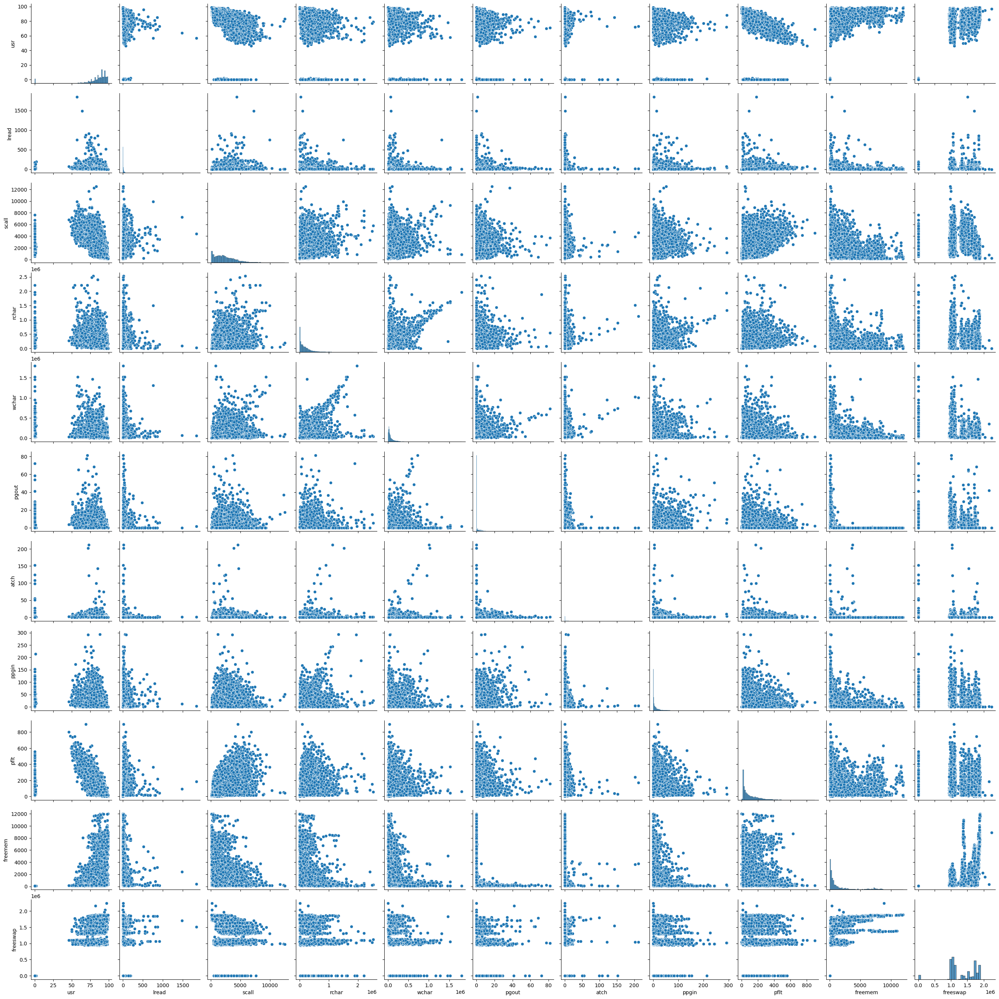

In [189]:
sns.pairplot(df[["usr","lread", "scall", "rchar", "wchar", "pgout", "atch", "ppgin",
       "pflt", "freemem", "freeswap", "runqsz"]])
plt.show()

In [190]:
X_train = X_train.drop(["pgout"],axis=1)

In [191]:
olsmod_118 = sm.OLS(y_train,X_train)
olsres_118 = olsmod_118.fit()
print(olsres_118.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.789
Model:                            OLS   Adj. R-squared:                  0.789
Method:                 Least Squares   F-statistic:                     2146.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        02:17:13   Log-Likelihood:                -16749.
No. Observations:                5734   AIC:                         3.352e+04
Df Residuals:                    5723   BIC:                         3.359e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   83.7223 

In [192]:
vif_series12 = pd.Series(
    [variance_inflation_factor(X_train.values,i)for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values:  \n\n{}\n".format(vif_series12))

VIF values:  

const                   27.396994
lread                    1.288663
scall                    1.730454
rchar                    1.690269
wchar                    1.398308
atch                     1.382950
ppgin                    1.369222
pflt                     1.558064
freemem                  1.837847
freeswap                 1.748937
runqsz_Not_CPU_Bound     1.141146
dtype: float64



In [193]:
.796-.789

0.007000000000000006

In [194]:
X_train119 = X_train.drop(["atch"],axis=1)
olsmod_119 = sm.OLS(y_train,X_train119)
olsres_119 = olsmod_119.fit()
print(
"R-squared:",
np.round(olsres_119.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_119.rsquared_adj,3),
)

R-squared: 0.789 
Adjusted R-squared: 0.789


In [204]:
.789-.789

0.0

In [195]:
X_train120 = X_train.drop(["lread"],axis=1)
olsmod_120 = sm.OLS(y_train,X_train120)
olsres_120 = olsmod_120.fit()
print(
"R-squared:",
np.round(olsres_120.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_120.rsquared_adj,3),
)

R-squared: 0.787 
Adjusted R-squared: 0.787


In [205]:
.789-.787

0.0020000000000000018

In [196]:
X_train121 = X_train.drop(["scall"],axis=1)
olsmod_121 = sm.OLS(y_train,X_train121)
olsres_121 = olsmod_121.fit()
print(
"R-squared:",
np.round(olsres_121.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_121.rsquared_adj,3),
)

R-squared: 0.777 
Adjusted R-squared: 0.777


In [206]:
.789-.777

0.01200000000000001

In [197]:
X_train122 = X_train.drop(["rchar"],axis=1)
olsmod_122 = sm.OLS(y_train,X_train122)
olsres_122 = olsmod_122.fit()
print(
"R-squared:",
np.round(olsres_122.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_122.rsquared_adj,3),
)

R-squared: 0.784 
Adjusted R-squared: 0.784


In [207]:
.789-.784

0.0050000000000000044

In [198]:
X_train123 = X_train.drop(["wchar"],axis=1)
olsmod_123 = sm.OLS(y_train,X_train123)
olsres_123 = olsmod_123.fit()
print(
"R-squared:",
np.round(olsres_123.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_123.rsquared_adj,3),
)

R-squared: 0.788 
Adjusted R-squared: 0.787


In [208]:
.789-.788

0.0010000000000000009

In [199]:
X_train124 = X_train.drop(["ppgin"],axis=1)
olsmod_124 = sm.OLS(y_train,X_train124)
olsres_124 = olsmod_124.fit()
print(
"R-squared:",
np.round(olsres_124.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_124.rsquared_adj,3),
)

R-squared: 0.783 
Adjusted R-squared: 0.783


In [209]:
.789-.783

0.006000000000000005

In [200]:
X_train125 = X_train.drop(["pflt"],axis=1)
olsmod_125 = sm.OLS(y_train,X_train125)
olsres_125 = olsmod_125.fit()
print(
"R-squared:",
np.round(olsres_125.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_125.rsquared_adj,3),
)

R-squared: 0.633 
Adjusted R-squared: 0.633


In [210]:
.789-.633

0.15600000000000003

In [201]:
X_train126 = X_train.drop(["freemem"],axis=1)
olsmod_126 = sm.OLS(y_train,X_train126)
olsres_126 = olsmod_126.fit()
print(
"R-squared:",
np.round(olsres_126.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_126.rsquared_adj,3),
)

R-squared: 0.788 
Adjusted R-squared: 0.788


In [211]:
.789-.788

0.0010000000000000009

In [202]:
X_train127 = X_train.drop(["freeswap"],axis=1)
olsmod_127 = sm.OLS(y_train,X_train127)
olsres_127 = olsmod_127.fit()
print(
"R-squared:",
np.round(olsres_127.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_127.rsquared_adj,3),
)

R-squared: 0.706 
Adjusted R-squared: 0.705


In [212]:
.789-.706

0.08300000000000007

In [203]:
X_train128 = X_train.drop(["runqsz_Not_CPU_Bound"],axis=1)
olsmod_128 = sm.OLS(y_train,X_train128)
olsres_128 = olsmod_128.fit()
print(
"R-squared:",
np.round(olsres_128.rsquared,3),
"\nAdjusted R-squared:",
np.round(olsres_128.rsquared_adj,3),
)

R-squared: 0.784 
Adjusted R-squared: 0.784


In [213]:
.789-.784

0.0050000000000000044

In [214]:
X_train = X_train.drop(["atch"],axis=1)

In [216]:
olsmod_129 = sm.OLS(y_train,X_train)
olsres_129 = olsmod_129.fit()
print(olsres_129.summary())

                            OLS Regression Results                            
Dep. Variable:                    usr   R-squared:                       0.789
Model:                            OLS   Adj. R-squared:                  0.789
Method:                 Least Squares   F-statistic:                     2385.
Date:                Sat, 15 Jul 2023   Prob (F-statistic):               0.00
Time:                        02:47:05   Log-Likelihood:                -16749.
No. Observations:                5734   AIC:                         3.352e+04
Df Residuals:                    5724   BIC:                         3.358e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   83.6953 

In [217]:
vif_series13 = pd.Series(
    [variance_inflation_factor(X_train.values,i)for i in range(X_train.shape[1])],
    index=X_train.columns,
)
print("VIF values:  \n\n{}\n".format(vif_series13))

VIF values:  

const                   26.875263
lread                    1.284903
scall                    1.726933
rchar                    1.672732
wchar                    1.398307
ppgin                    1.340044
pflt                     1.552004
freemem                  1.699687
freeswap                 1.745849
runqsz_Not_CPU_Bound     1.134227
dtype: float64



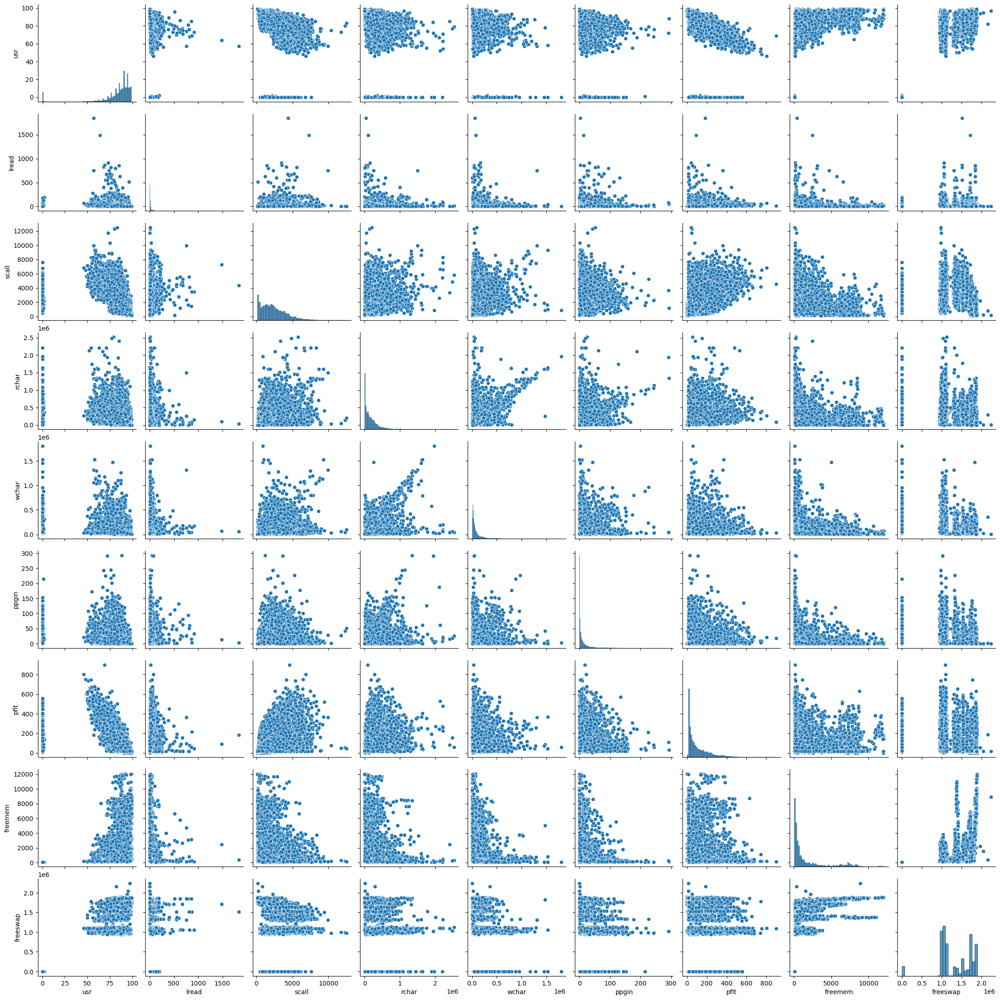

In [227]:
sns.pairplot(df[["usr","lread", "scall", "rchar", "wchar", "ppgin",
       "pflt", "freemem", "freeswap", "runqsz"]])
plt.show()

# PROBLEM 2

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
cData=pd.read_excel('Contraceptive_method_dataset.xlsx')

In [3]:
cData.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No


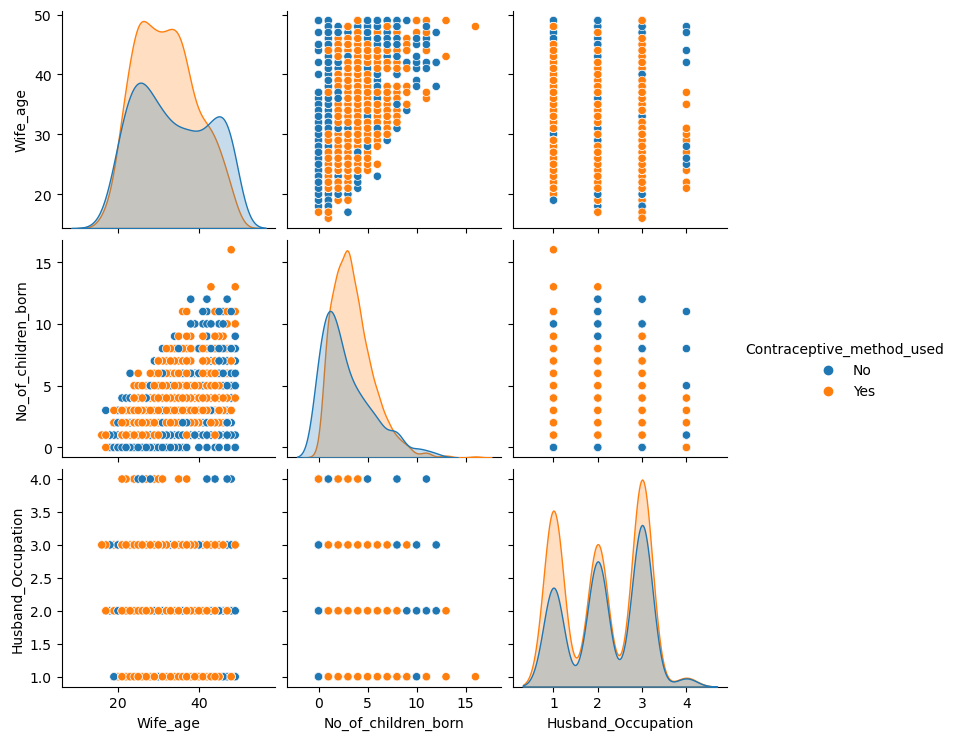

In [4]:
sns.pairplot(data=cData, hue='Contraceptive_method_used')

In [5]:
cData['Contraceptive_method_used'].value_counts()

Yes    844
No     629
Name: Contraceptive_method_used, dtype: int64

In [6]:
cData.describe().T

,count,mean,std,min,25%,50%,75%,max
Wife_age,1402.0,32.606277,8.274927,16.0,26.0,32.0,39.0,49.0
No_of_children_born,1452.0,3.254132,2.365212,0.0,1.0,3.0,4.0,16.0
Husband_Occupation,1473.0,2.137814,0.864857,1.0,1.0,2.0,3.0,4.0
